# MNIST Point Set Visualization
- By running this script, you can get images of point sets.
## To run this code...
- You should prepare the summary file by running sample_and_summarize.py with a trained checkpoint.
- You should install below libraries.
    - matplotlib
    - open3d
    - numpy
    - torch
    - torchvision
    - tqdm

In [36]:
import os
import random
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import open3d as o3d

import numpy as np
import pandas as pd
import scanpy as sc
import torch
torch.no_grad()
from torchvision.utils import save_image, make_grid

from draw import draw

## Set directories
1. summary file path: summary_name
2. path to save images: save_dir

In [2]:
save_dir = 'images'
experiment_name = 'syn_sadefeldman_beta1'
summary_name = os.path.join('../checkpoints/gen/', experiment_name, 'summary.pth')

imgdir = os.path.join(save_dir, experiment_name)
imgdir_gt = os.path.join(imgdir, 'gt')
imgdir_recon = os.path.join(imgdir, 'recon')
imgdir_gen = os.path.join(imgdir, 'gen')

os.makedirs(save_dir, exist_ok=True)
os.makedirs(imgdir_gt, exist_ok=True)
os.makedirs(imgdir_recon, exist_ok=True)
os.makedirs(imgdir_gen, exist_ok=True)

In [3]:
summary = torch.load(summary_name)
for k, v in summary.items():
    try:
        print(f"{k}: {v.shape}")
    except AttributeError:
        print(f"{k}: {len(v)}")

smp_set: torch.Size([120, 700, 20])
smp_mask: torch.Size([120, 700])
smp_att: 5
priors: 6
recon_set: torch.Size([120, 700, 20])
recon_mask: torch.Size([120, 700])
posteriors: 6
dec_att: 5
enc_att: 5
enc_hiddens: 15
gt_set: torch.Size([120, 350, 20])
gt_mask: torch.Size([120, 350])
mean: torch.Size([15])
std: torch.Size([15])
sid: 15
mid: 15
pid: 15
cardinality: 15


## Select the samples to visualize
- parse the samples by index.
- below default code will visualize all samples. **Warning: Requires Huge Memory**

In [4]:
recon_targets = list(range(len(summary['gt_mask'])))[:]
gen_targets = list(range(len(summary['smp_mask'])))[:]

In [5]:
len_att = len(summary['dec_att'])
gt = summary['gt_set'][recon_targets]
gt_mask = summary['gt_mask'][recon_targets]

recon = summary['recon_set'][recon_targets]
recon_mask = summary['recon_mask'][recon_targets]

dec_att = [summary['dec_att'][l][:, :, recon_targets] for l in range(len_att)]
enc_att = [summary['enc_att'][l][:, :, recon_targets] for l in range(len_att)]

gen = summary['smp_set'][gen_targets]
gen_mask = summary['smp_mask'][gen_targets]
gen_att = [summary['smp_att'][l][:, :, gen_targets] for l in range(len_att)]

## Visualize

In [6]:
def visualize(gt, gt_mask):
    return draw(gt, gt_mask)

### Visualize Recon

In [10]:
recon_imgs = visualize(recon, recon_mask)
for idx in range(len(recon_targets)):
    data_idx = recon_targets[idx]
    if torch.nonzero(recon_imgs[idx].float().mean(0) != 1).shape[0] == 0:
        print("SKIP")
        continue
    save_image(recon_imgs[idx] / 255., os.path.join(imgdir_recon, f'{data_idx}.png'))
del recon_imgs

### Visualize GT

In [11]:
gt_imgs = visualize(gt, gt_mask)
for idx in range(len(recon_targets)):
    data_idx = recon_targets[idx]
    if torch.nonzero(gt_imgs[idx].float().mean(0) != 1).shape[0] == 0:
        print("SKIP")
        continue
    save_image(gt_imgs[idx]/255, os.path.join(imgdir_gt, f'{data_idx}.png'))
del gt_imgs

### Visualize Generated Samples

In [12]:
gen_imgs = visualize(gen, gen_mask)
for idx in range(len(gen_targets)):
    if torch.nonzero(gen_imgs[idx].float().mean(0) != 1).shape[0] == 0:
        print("SKIP")
        continue
    data_idx = gen_targets[idx]
    save_image(gen_imgs[idx]/255, os.path.join(imgdir_gen, f'{data_idx}.png'))
del gen_imgs

In [13]:
print("Done")

Done


# Collate data across all samples. run UMAP, and viz

inputs were of size 350 cells each; it reconstructed (and generated) samples of 700 cells each
I thought that reconstruction should be set to have the same cardinality as gt?

In [9]:
print(gt.shape)
print(recon.shape)

torch.Size([120, 350, 20])
torch.Size([120, 700, 20])


In [6]:
gt_adata = sc.read_h5ad("/localdata/rna_rep_learning/sadefeldman/synthetic_data/synthetic_adata.h5ad")

/opt/conda/rpeyser/envs/scset3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [9]:
recon.reshape(-1,20)

torch.Size([84000, 20])

In [11]:
recon_adata = sc.AnnData(np.zeros([recon.reshape(-1,20).shape[0], len(gt_adata.var)]))

/tmp/ipykernel_3476093/2132546857.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  recon_adata = sc.AnnData(np.zeros([recon.reshape(-1,20).shape[0], len(gt_adata.var)]))


In [19]:
recon_adata.varm['PCs'] = gt_adata.varm['PCs']

In [27]:
recon_adata.obsm['X_pca'] = recon.reshape(-1,20).numpy()

In [25]:
recon_adata.var = gt_adata.var[['n_cells','highly_variable','means','mean','std']]

In [15]:
#for some reasom .varm containing the gene PC loadings was not saved -- recalculate
sc.tl.pca(gt_adata, svd_solver='arpack')

In [28]:
# save synthetic adata
recon_adata.write("/localdata/rna_rep_learning/sadefeldman/synthetic_data/recon_adata.h5ad")

#### calculate neighbors & UMAP for reconstructed cells

In [29]:
sc.pp.neighbors(recon_adata, n_neighbors=10, n_pcs=20)

In [30]:
sc.tl.umap(recon_adata)

/opt/conda/rpeyser/envs/scset3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


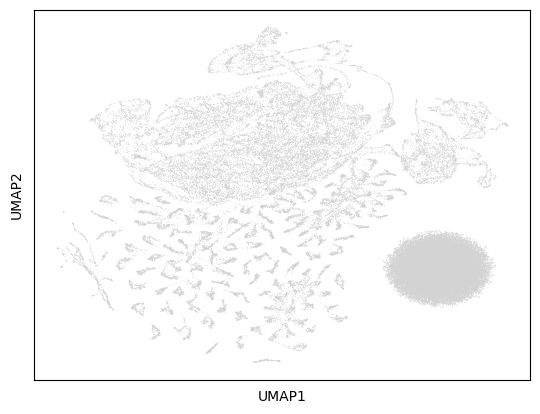

In [31]:
sc.pl.umap(recon_adata)#, color=['CD14','CD33','CD8A','CD4','IL7R','SDC1','FGFR3','S100A8','S100A9','CD27','CD19'])

In [38]:
#add PCs to obs in order to color by them
recon_adata.obs = pd.DataFrame(recon_adata.obsm['X_pca'], columns=["PC"+str(i) for i in range(1,recon_adata.obsm['X_pca'].shape[1]+1)])

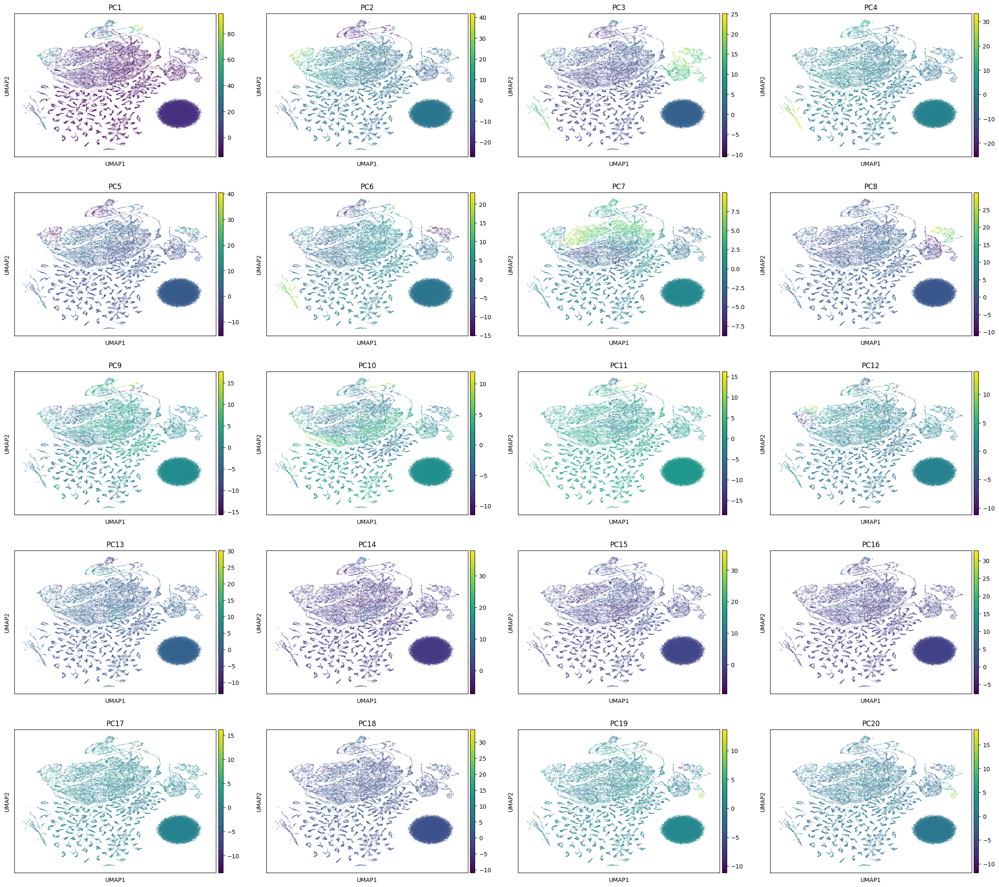

In [39]:
sc.pl.umap(recon_adata, color=["PC"+str(i) for i in range(1,21)])

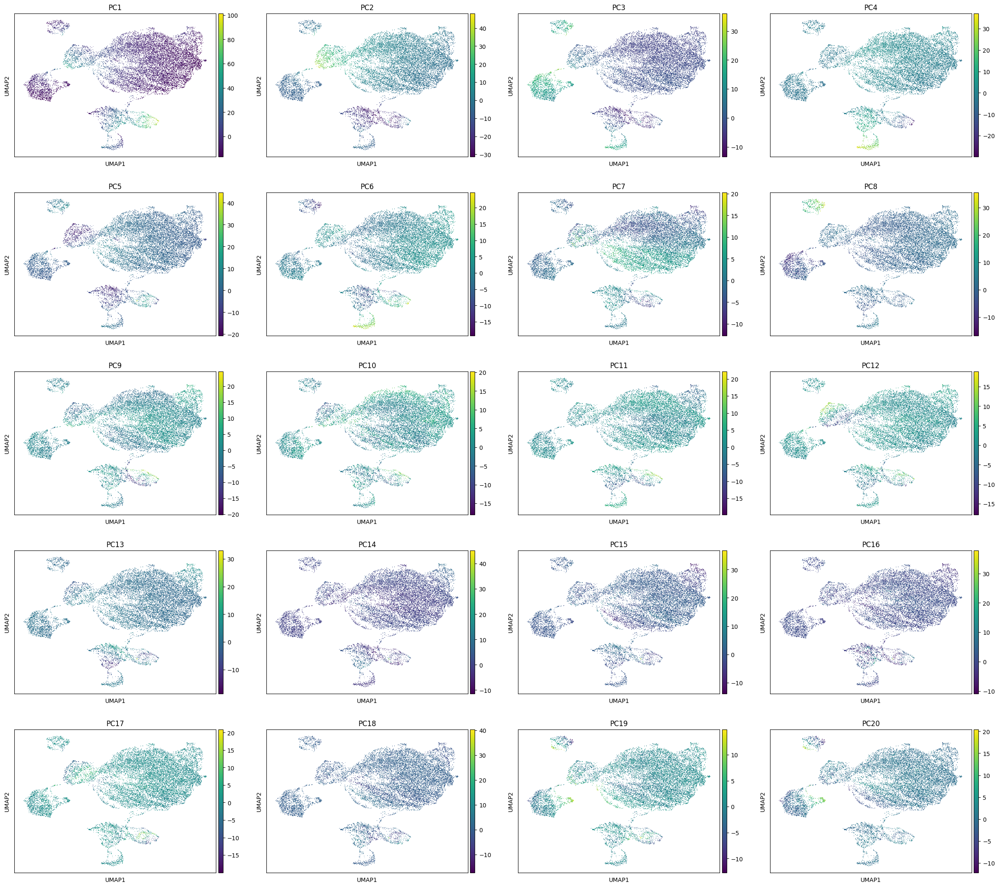

In [ ]:
sc.pl.umap(synthetic_adata, color=["PC"+str(i) for i in range(1,21)])

#### calculate gene expression based on predicted PCs for reconstructed data (as a baseline, check how different PC-reconstructed gene expression and true gene expression is for gt data)

In [51]:
recon_adata.X = np.matmul(recon_adata.obsm['X_pca'], recon_adata.varm['PCs'][:,:20].transpose())

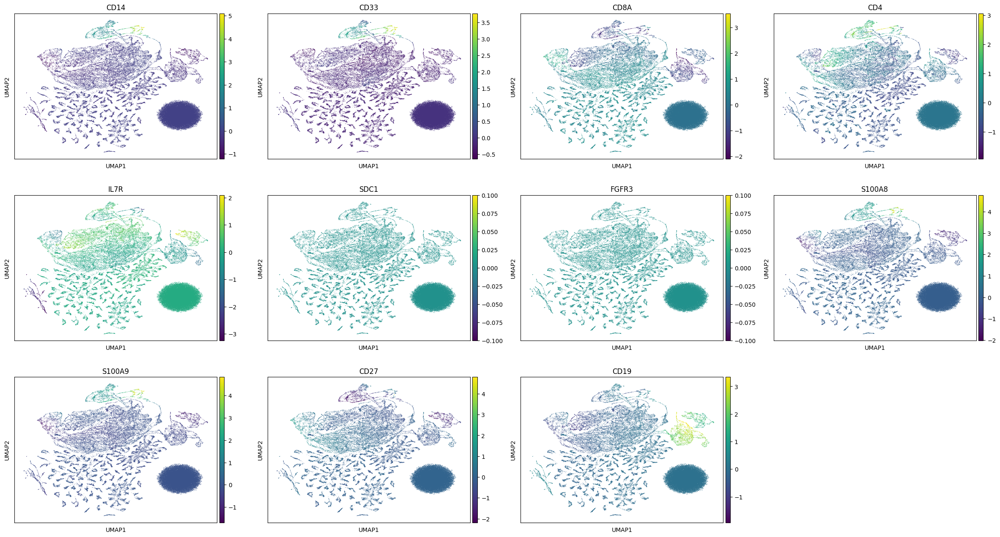

In [53]:
sc.pl.umap(recon_adata, color=['CD14','CD33','CD8A','CD4','IL7R','SDC1','FGFR3','S100A8','S100A9','CD27','CD19'])

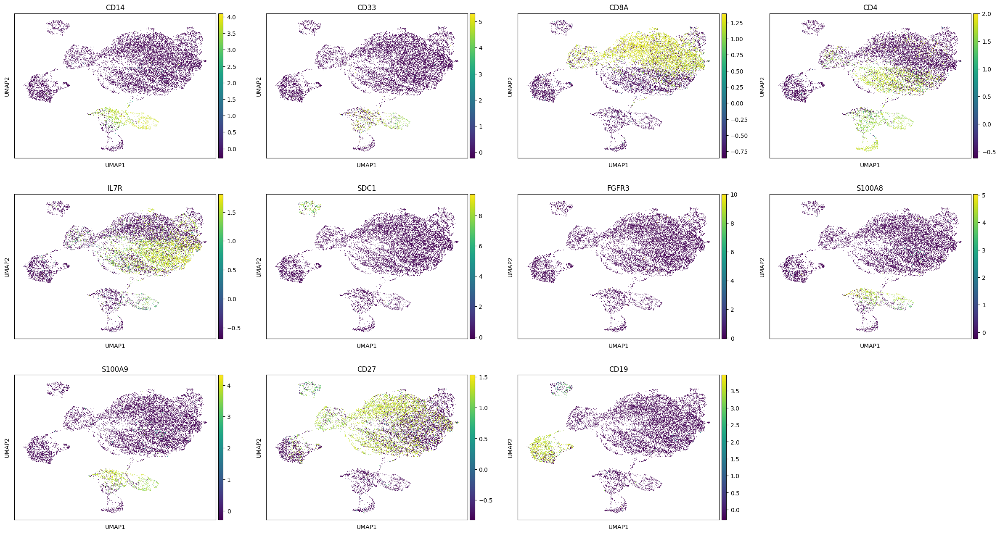

In [54]:
sc.pl.umap(gt_adata, color=['CD14','CD33','CD8A','CD4','IL7R','SDC1','FGFR3','S100A8','S100A9','CD27','CD19'])

# Viz Patient Reps

In [7]:
gt.shape

torch.Size([120, 350, 20])

In [8]:
gen.shape

torch.Size([120, 700, 20])